# Species Classification Using CNN: A Case Study on Mushrooms

## Problem Statement
Accurately classifying diverse species is crucial for applications such as biodiversity studies, ecological monitoring, and resource management. Mushroom classification, for example, is essential for identifying edible and poisonous varieties, ensuring food safety, and supporting culinary practices. However, the inherent complexity of species characteristics—such as variations in shape, texture, and color—combined with the scarcity of large-scale annotated datasets presents significant challenges. These limitations underscore the need for innovative solutions to address species classification in resource-constrained scenarios.
## Introduction
This project explores the application of Convolutional Neural Networks (CNNs) for species classification using a very small image dataset, with a focus on mushroom classification as a case study. Leveraging the MobileNetV2 model, it classifies 215 mushroom types through data preprocessing techniques like resizing and augmentation to unify and expand the dataset. The study compares three CNN architectures—MobileNetV2, VGG16, and EfficientNetB0—and identifies the best-performing model. Optimizations such as unfreezing the last 50 layers, L2 regularization, learning rate adjustments, early stopping, a learning rate scheduler, and increased training epochs improved validation accuracy from 26% to 67%. Machine learning interpretation methods, including accuracy/loss metrics, Top N Correct and Misclassified Classes analyses, Accuracy/Loss plots, and Grad-CAM heatmaps, provide insights into model performance and outputs. By introducing an external mushroom dataset for validation, this work presents a novel framework for testing model generalizability. While focused on mushroom classification, the study addresses broader challenges of large-species classification with small datasets and demonstrates how lightweight CNNs can be adapted to resource-constrained environments, offering practical solutions for biodiversity studies, ecological monitoring, and other domains requiring efficient classification of diverse species.

## Goals and Objectives
- Primary Goals:
  - Develop an effective CNN model for classifying 215 mushroom species using a small dataset.
  - Achieve a significant improvement in validation accuracy through model optimization techniques.
  - Explore effective methods for interpreting image classification outputs.
  - Bridge the gap between machine learning model research and real-world applications.
- Secondary Goals:
  - Compare the performance of MobileNetV2, VGG16, and EfficientNetB0 models.
  - Provide interpretable insights into classification outcomes using advanced visualization techniques.
  - Validate model performance with external mushroom datasets to assess generalizability.

## Data Resource
This project is based on the Kaggle mushroom identification data set:
https://www.kaggle.com/datasets/daniilonishchenko/mushrooms-images-classification-215/data
- The Kaggle Mushrooms Images Classification 215 dataset, comprising 3,122 images (512x512 resolution) across 215 mushroom species, with at least 4 images per class, and a file mushrooms.txt containing names of all the mushrooms for the dataset.
-	External mushroom images are used to evaluate the well-trained model's generalizability.

## Implementation Architecture
![](https://raw.githubusercontent.com/mariazhou668899/MushroomsClassification/main/data_flow.png)


## Key Conclusions
- **1. Model Performance**: When epoch is 6, MobileNetV2 achieves the highest validation accuracy, outperforming VGG16 (in the middle) and EfficientNetB0 (which has the lowest accuracy).
- **2. Optimization Techniques**: The project explores various optimization techniques for MobileNetV2, including unfreezing the last 50 layers, L2 regularization, learning rate adjustments, early stopping, a learning rate scheduler, and increased training epochs. Among these, increasing the training epochs proved to be the most effective, as it boosted MobileNetV2's validation accuracy from 26% (setting epoch 6) to 67% (setting epoch 100).
- **3. Image Argumentation**: Image augmentation plays a crucial role in working with small image datasets for machine learning. By significantly expanding the dataset and balancing the class distribution, it helps improve the model's robustness and performance in scenarios with limited data.
- **4. Output Interpretation**:
 - **Grad-CAM Heatmaps Analysis**: By outputting the original image, heatmap image, and superimposed image for each instance of the worst misclassified class, it becomes clear that while MobileNetV2 identifies the correct mushroom region, the misclassification likely arises from the similarity between this mushroom and other classes.  This suggests that the model may be struggling to distinguish between visually similar species, even though the correct region is highlighted in the heatmap.  This points to the challenge of fine-grained classification in species with overlapping visual features, and it may indicate the need for further model adjustments or more distinct data features to improve accuracy.
 - **Class-wise Performance Insights**:Class-wise Performance Insights: After analyzing the Top N Correct and Misclassified Classes' original images, it is observed that both categories have a similar number of image instances. The images of the top N correct classes predominantly feature the entire mushroom body from various angles, while the misclassified classes mostly contain partial images or similar angles of the mushrooms. This suggests that the model performs better when presented with full-body images from different angles. It can be inferred that providing more comprehensive views of the mushrooms, including multiple angles, could help improve the model's accuracy and its ability to distinguish between closely related classes.
- **5. Accuracy & Loss Plots Analysis**: There is a clear trend of increasing accuracy (both training and validation accuracy) and decreasing loss (both training and validation loss) as the epochs progress, indicating that the model is effectively learning and improving its predictions over time.

  - **Accuracy Plot**: The training accuracy starts at a low 3.90%, then rapidly increases to over 98% by epoch 24, after which it stabilizes. In contrast, the validation accuracy starts at 2.93%, climbing sharply to 60.75% by epoch 35, and subsequently reaches a plateau. This suggests that the validation accuracy follows a similar trend to the training accuracy but with a delayed response. Notably, the validation accuracy increases at a much slower rate compared to training accuracy, which could indicate a degree of overfitting, as the model fits the training data better than the unseen validation data.

  - **Loss Plot**: The training loss begins at a high 18.01 and sharply decreases to 0.6893 by epoch 24, where it then stabilizes. The validation loss follows a similar pattern, starting at 12.5763 and dropping to 1.9147 by epoch 35, before reaching a plateau. Again, the validation loss decreases more slowly compared to the training loss, which is consistent with the observed difference in accuracy. The slower reduction in validation loss compared to training loss reinforces the idea that the model may be overfitting, as the training data is being modeled with increasing precision, while the model generalizes less effectively to unseen data.

  Overall, the patterns in both accuracy and loss suggest that while the model improves steadily during training, the gap between training and validation performance indicates that there might still be room for improvement in generalization. Although regularization techniques (such as L2 regularization) and data augmentation have been applied, the slower improvement in validation accuracy and the smaller reduction in validation loss compared to the training loss point to potential overfitting. This implies that while the model is learning the training data well, it may struggle to generalize effectively to unseen data. To further address this, additional measures, such as fine-tuning the augmentation strategies, adjusting the model complexity, or incorporating techniques like dropout, might be needed to reduce overfitting and improve the model's ability to generalize.
- **6. External Image Validation**: Testing the model with external image and comparing it to the images in the dataset's class demonstrates that the trained MobileNetV2 model is capable of accurately predicting the specie of unseen mushroom image. This validates the model's potential for real-world applications, such as a mushroom identification platform. With further training and fine-tuning, particularly on more diverse and extensive datasets, the model could become even more reliable for practical use in species identification tasks.



# 1. Data Acquisition

## 1.1 Load Kaggle API tokens from Local

In [ ]:
# Upload kaggle.json to your Colab session
from google.colab import files
files.upload()

# Move the kaggle.json file to ~/.kaggle
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


## 1.2 Download Mushroom Dataset from Kaggle to Google Driver

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Install Kaggle API
!pip install kaggle

In [ ]:
# Download the dataset and save it to Google Drive
!kaggle datasets download -d daniilonishchenko/mushrooms-images-classification-215 -p "/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset" --unzip


Dataset URL: https://www.kaggle.com/datasets/daniilonishchenko/mushrooms-images-classification-215
License(s): ODC Public Domain Dedication and Licence (PDDL)
 99% 1.54G/1.55G [00:18<00:00, 96.4MB/s]
100% 1.55G/1.55G [00:18<00:00, 87.7MB/s]


# 2. Import Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.applications import VGG16, MobileNetV2, ResNet50, EfficientNetB0, InceptionV3
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers.schedules import ExponentialDecay

In [ ]:
from tensorflow.keras import layers, models, optimizers

# 3. Data Pre-processing

There are 3122 images in total out of the 215 species. On average each class has at around 14 images. Most classes are balanced. The key problem is just that the dataset is too small for each specie. I need to augment this dataset to make it larger before feeding into CNN model.

Here are some main Data Processing:
- **Resize**: For feeding into models, the original images are resized into 128 * 128.
- **About Augumentation**: My augmentation applies scaling, rotation, shifting, shearing, zooming, horizontal flipping, and gap filling to dynamically enhance the diversity of my training images, improving model robustness and generalization.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Configurable parameters
TRAIN_DIR = '/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/data/data'
TARGET_SIZE = (128, 128)
BATCH_SIZE = 32
NUM_CLASSES = 215
EPOCHS = 50
LEARNING_RATE = 0.0001

In [ ]:
# Data augmentation and loading
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # Reserve 20% for validation
)

# Apply augumentation in the train dataset
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)
# No augumentation in the validation dataset
validation_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)


Found 2508 images belonging to 215 classes.
Found 614 images belonging to 215 classes.


# 4. Choosing Best Pre-trained Model((MobileNetV2, VGG16, EfficientNetB0))

Through a comparison of three common lightweight models—MobileNetV2, VGG16, and EfficientNetB0—using identical parameter settings, it is evident that the EfficientNetB0 model outperforms the others in terms of overall performance. This indicates that EfficientNetB0 is more efficient and better suited for small dataset classification tasks, achieving higher accuracy and faster convergence compared to MobileNetV2 and VGG16 in this study.

In [ ]:
# Dictionary to store model performance
model_performance = {}

# Reduced model candidates to focus on 3 typical architectures
model_candidates = {
    "MobileNetV2": MobileNetV2,
    "VGG16": VGG16,
    "EfficientNetB0": EfficientNetB0
}

# Adjust the number of epochs to save training time
EPOCHS = 6  # Reduced to fewer epochs for faster comparison

# Loop through selected model candidates
for model_name, model_class in model_candidates.items():
    print(f"\nTraining model: {model_name}")

    # Load the base model with pre-trained weights, excluding top layers
    base_model = model_class(weights="imagenet", include_top=False, input_shape=(TARGET_SIZE[0], TARGET_SIZE[1], 3))
    base_model.trainable = False  # Freeze the base model layers

    # Add classifier layers
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(1024, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(NUM_CLASSES, activation='softmax')  # Output layer for NUM_CLASSES classes
    ])

    # Compile the model with a lower learning rate
    model.compile(optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    # Train the model with fewer epochs
    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=EPOCHS,  # Reduced epochs
        verbose=1
    )

    # Save model performance
    model_performance[model_name] = {
        "accuracy": max(history.history['val_accuracy']),
        "loss": min(history.history['val_loss'])
    }

# Print out performance results
print("\nModel Performance Comparison:")
for model_name, performance in model_performance.items():
    print(f"{model_name}: Accuracy = {performance['accuracy']:.4f}, Loss = {performance['loss']:.4f}")



Training model: MobileNetV2
Epoch 1/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step - accuracy: 0.0094 - loss: 5.9213 - val_accuracy: 0.0114 - val_loss: 5.2247
Epoch 2/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 138s 1s/step - accuracy: 0.0188 - loss: 5.2906 - val_accuracy: 0.0619 - val_loss: 5.0131
Epoch 3/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - accuracy: 0.0364 - loss: 5.0152 - val_accuracy: 0.1156 - val_loss: 4.7768
Epoch 4/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 120s 1s/step - accuracy: 0.0663 - loss: 4.7564 - val_accuracy: 0.1645 - val_loss: 4.5398
Epoch 5/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 147s 1s/step - accuracy: 0.1165 - loss: 4.4101 - val_accuracy: 0.2166 - val_loss: 4.2418
Epoch 6/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 154s 2s/step - accuracy: 0.1669 - loss: 4.0789 - val_accuracy: 0.2606 - val_loss: 3.9616

Training model: VGG16
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Epoch 1/6
79/79 ━━━━━━━━━━━━━━━━━━━━ 665s 8s/step - accuracy: 0.0032 - loss: 5.5172 - val_accuracy: 0.0033 - val_loss: 5.3739
Epoch 2/6
79/79

# 5. Define and Train Best Model - MobileNetV2

In [ ]:
from tensorflow.keras import regularizers
base_model = MobileNetV2(input_shape=(128, 128, 3), include_top=False, weights='imagenet')

# Fine-tune more layers
for layer in base_model.layers[:-50]:  # Unfreeze last 50 layers
    layer.trainable = False
base_model.trainable = True

# Build model with L2 regularization
model = models.Sequential([
    base_model,
    layers.BatchNormalization(),
    layers.GlobalAveragePooling2D(),
    layers.Dense(2048, activation='relu', kernel_regularizer=regularizers.l2(0.01)),  # Increased size and L2 regularization
    layers.Dropout(0.5),
    layers.Dense(NUM_CLASSES, activation='softmax')
])

# Compile model with larger learning rate
model.compile(
    optimizer=optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Early stopping and learning rate scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', patience=3, factor=0.5, verbose=1, min_lr=1e-6)

# Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=100,
    callbacks=[early_stopping, lr_scheduler],
    verbose=1
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


79/79 ━━━━━━━━━━━━━━━━━━━━ 734s 9s/step - accuracy: 0.0390 - loss: 18.0124 - val_accuracy: 0.0293 - val_loss: 12.5763 - learning_rate: 0.0010
Epoch 2/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step - accuracy: 0.2043 - loss: 8.4723 - val_accuracy: 0.0228 - val_loss: 11.4700 - learning_rate: 0.0010
Epoch 3/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 201s 2s/step - accuracy: 0.3423 - loss: 5.5725 - val_accuracy: 0.0212 - val_loss: 11.1084 - learning_rate: 0.0010
Epoch 4/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 217s 2s/step - accuracy: 0.3840 - loss: 4.7321 - val_accuracy: 0.0244 - val_loss: 12.5824 - learning_rate: 0.0010
Epoch 5/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 205s 2s/step - accuracy: 0.5087 - loss: 3.9857 - val_accuracy: 0.0391 - val_loss: 11.8930 - learning_rate: 0.0010
Epoch 6/100
79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5413 - loss: 3.7078
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
79/79 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step - accuracy: 0.5409 - loss: 3.7095 - val_accura

### Save Well-trained Model

In [ ]:
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import activations
from tensorflow.keras.utils import get_custom_objects


In [ ]:
from tensorflow.keras.activations import softmax

# Restore the activation of the last layer
model.layers[-1].activation = softmax

# Save the model
model.save('/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/my_model.keras')


# 6. Output Interpretation

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128 (Functional)    │ (None, 4, 4, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 4, 4, 1280)          │           5,120 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2048)                │       2,623,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 215)                 │         440,535 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,170,503 (57.87 MB)

 Trainable params: 4,921,687 (18.77 MB)

 Non-trainable params: 405,440 (1.55 MB)

 Optimizer params: 9,843,376 (37.55 MB)

## 6.1 Create Mushroom Lables for Analysis

In [ ]:
with open('/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/mushrooms.txt', 'r', encoding='cp932') as f:
    cls_data = f.read()
    _class_list = list(str(cls_data).split('\n'))
    class_list = [cls.replace('-', '_').replace('痴','s').replace('.','') for cls in _class_list]
    print('Mashroom Classes:')
    print(class_list)

Mashroom Classes:
['almond_mushroom', 'amanita_gemmata', 'amethyst_chanterelle', 'amethyst_deceiver', 'aniseed_funnel', 'ascot_hat', 'bay_bolete', 'bearded_milkcap', 'beechwood_sickener', 'beefsteak_fungus', 'birch_polypore', 'birch_woodwart', 'bitter_beech_bolete', 'bitter_bolete', 'black_bulgar', 'black_morel', 'blackening_brittlegill', 'blackening_polypore', 'blackening_waxcap', 'blue_roundhead', 'blushing_bracket', 'blushing_rosette', 'blushing_wood_mushroom', 'bovine_bolete', 'bronze_bolete', 'brown_birch_bolete', 'brown_rollrim', 'bruising_webcap', 'butter_cap', 'cauliflower_fungus', 'cedarwood_waxcap', 'chanterelle', 'charcoal_burner', 'chestnut_bolete', 'chicken_of_the_woods', 'cinnamon_bracket', 'clouded_agaric', 'clustered_domecap', 'common_bonnet', 'common_inkcap', 'common_morel', 'common_puffball', 'common_rustgill', 'crimped_gill', 'crimson_waxcap', 'cucumber_cap', 'curry_milkcap', 'deadly_fibrecap', 'deadly_webcap', 'deathcap', 'deer_shield', 'destroying_angel', 'devils_b

### 6.1.1 Show Mushroom's Image and Label

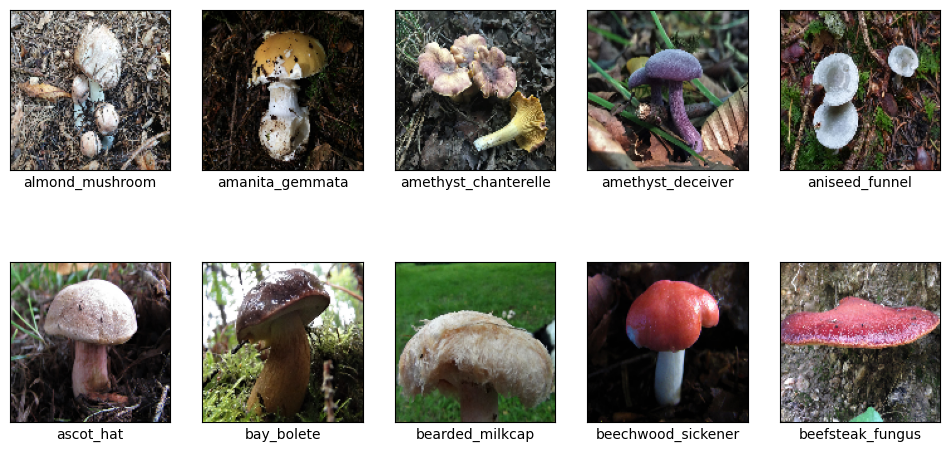

In [ ]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

image_size = (128, 128)
images_all = []
labels_all = []

# Select 10 mushroom types and corresponding images
selected_classes = class_list[:10]  # Select first 10 mushroom types

for class_name in selected_classes:
    class_path = os.path.join('/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/', 'data', 'data', class_name)

    # Ensure that we pick only one image per class (first valid image)
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)

        if os.path.isfile(image_path) and image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            image = load_img(image_path, target_size=image_size)
            image = img_to_array(image)
            images_all.append(image)
            labels_all.append(class_list.index(class_name))
            break  # Only take one image per class

images = np.array(images_all)
labels = np.array(labels_all)

num_classes = len(class_list)
labels = tf.keras.utils.to_categorical(labels, num_classes)

# Plot 10 images (1 image per mushroom type)
plt.figure(figsize=(12, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(array_to_img(images[i], scale=True))
    plt.xlabel(class_list[np.argmax(labels[i])])
plt.show()


## 6.2 Model performance(accuracy & Loss Metrics)


This performance is for the epoch with the maximum validation accuracy(0.669).


In [ ]:
# Model performance tracking
model_performance = {
    "MobileNetV2": {
        "accuracy": max(history.history['val_accuracy']),
        "loss": min(history.history['val_loss'])
    }
}

print("Model Performance at Epoch with Max Validation Accuracy:\n")
print(f"Validation Accuracy: {model_performance['MobileNetV2']['accuracy']}")
print(f"Loss: {model_performance['MobileNetV2']['loss']}")

Model Performance at Epoch with Max Validation Accuracy:

Validation Accuracy: 0.6693810820579529
Loss: 1.5657936334609985


## 6.3 Top N Correct Classified Classes

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

# Predict on the validation set
y_pred = model.predict(validation_generator)
y_pred_class = np.argmax(y_pred, axis=1)

# True labels
y_true = validation_generator.classes

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred_class)

# Extract the correctly classified counts (diagonal elements of the confusion matrix)
correct_classifications = np.diag(cm)

# Sort and select the top 3 correctly classified classes
top_3_correct_classes = np.argsort(correct_classifications)[-3:]  # Top 3 classes with most correct predictions

# Print the Top 5 Right-Classified Classes
print("Top 3 Correctly Classified Classes:")
for idx in top_3_correct_classes:
    print(f"Class {idx}: {class_list[idx]}")



20/20 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step
Top 3 Correctly Classified Classes:
Class 177: suede_bolete
Class 55: dusky_puffball
Class 27: bruising_webcap


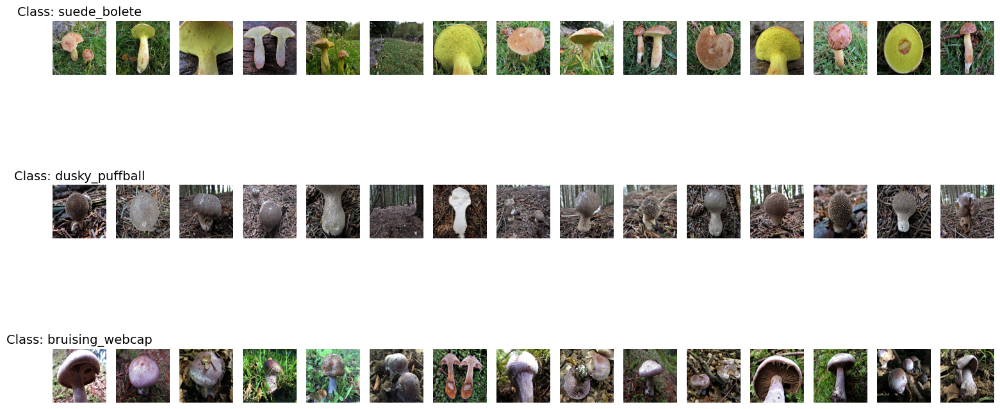

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img

# Define image size and prepare lists to hold images and labels
image_size = (128, 128)
images_all = []
labels_all = []


# Load images for the top 3 correctly classified classes
for idx in top_3_correct_classes:
    class_name = class_list[idx]  # Get the class name from class_list
    class_path = os.path.join('/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/', 'data', 'data', class_name)

    # Try to find and load all valid images for this class
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)

        if os.path.isfile(image_path) and image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            image = load_img(image_path, target_size=image_size)
            image = img_to_array(image)
            images_all.append(image)
            labels_all.append(idx)  # Store the index of the class

# Convert to numpy arrays for easier manipulation
images_all = np.array(images_all)
labels_all = np.array(labels_all)

# Calculate the number of rows we need based on the number of images per class
fig, axes = plt.subplots(len(top_3_correct_classes), max([len(images_all[labels_all == idx]) for idx in top_3_correct_classes]), figsize=(15, len(top_3_correct_classes) * 3))

# Loop through the top 3 classes and display all corresponding images
for row, idx in enumerate(top_3_correct_classes):
    # Get the images corresponding to the current class
    class_images = images_all[labels_all == idx]

    # Loop over the images for this class and plot them
    for col, image in enumerate(class_images):
        ax = axes[row, col]  # Access the corresponding subplot for this image
        ax.imshow(array_to_img(image, scale=True))
        ax.axis('off')  # Remove axis for cleaner display

    # Set the title for the row
    axes[row, 0].set_title(f"Class: {class_list[idx]}", fontsize=14)

# Remove any extra subplots if a class has fewer than the maximum number of images
for row in range(len(top_3_correct_classes)):
    for col in range(len(class_images), axes.shape[1]):
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()


## 6.4 Top N Misclassified Classes

In [ ]:


# Sum the misclassifications for each class
misclassifications = np.sum(cm, axis=1) - np.diag(cm)

# Sort and select top 3 misclassified classes
top_3_misclassified_classes = np.argsort(misclassifications)[-3:]  # Top 3 classes with most misclassifications

# Print the Top 5 Misclassified Classes
print("Top 3 Misclassified Classes:")
for idx in top_3_misclassified_classes:
    print(f"Class {idx}:{class_list[idx]}")


Top 3 Misclassified Classes:
Class 83:grey_knight
Class 85:grisettes
Class 213:yellow_stainer


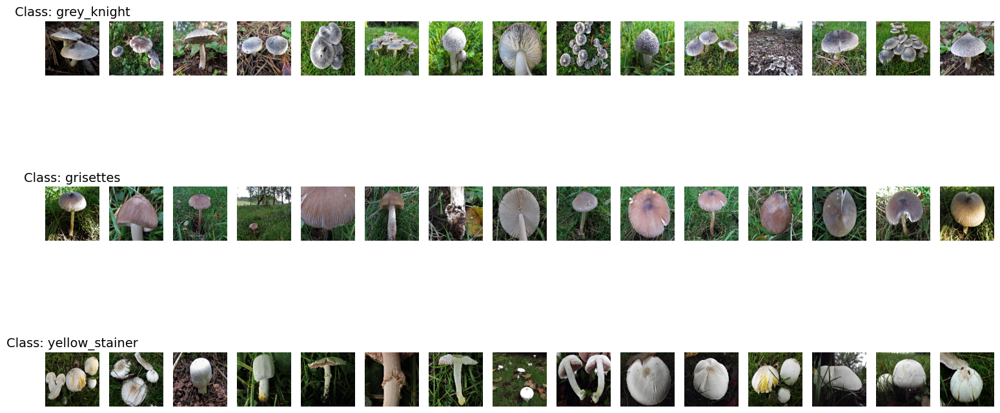

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img

# Define image size and prepare lists to hold images and labels
image_size = (128, 128)
images_all = []
labels_all = []


# Load images for the top 3 misclassified classes
for idx in top_3_misclassified_classes:
    class_name = class_list[idx]  # Get the class name from class_list
    class_path = os.path.join('/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/', 'data', 'data', class_name)

    # Try to find and load all valid images for this class
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)

        if os.path.isfile(image_path) and image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            image = load_img(image_path, target_size=image_size)
            image = img_to_array(image)
            images_all.append(image)
            labels_all.append(idx)  # Store the index of the class

# Convert to numpy arrays for easier manipulation
images_all = np.array(images_all)
labels_all = np.array(labels_all)

# Calculate the number of rows we need based on the number of images per class
fig, axes = plt.subplots(len(top_3_misclassified_classes), max([len(images_all[labels_all == idx]) for idx in top_3_misclassified_classes]), figsize=(15, len(top_3_misclassified_classes) * 3))

# Loop through the top 5 classes and display all corresponding images
for row, idx in enumerate(top_3_misclassified_classes):
    # Get the images corresponding to the current class
    class_images = images_all[labels_all == idx]

    # Loop over the images for this class and plot them
    for col, image in enumerate(class_images):
        ax = axes[row, col]  # Access the corresponding subplot for this image
        ax.imshow(array_to_img(image, scale=True))
        ax.axis('off')  # Remove axis for cleaner display

    # Set the title for the row
    axes[row, 0].set_title(f"Class: {class_list[idx]}", fontsize=14)

# Remove any extra subplots if a class has fewer than the maximum number of images
for row in range(len(top_3_misclassified_classes)):
    for col in range(len(class_images), axes.shape[1]):
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()


## 6.5 Accuracy and Loss Plots

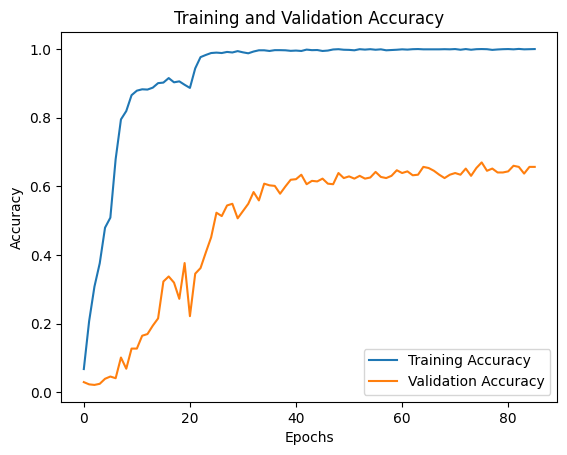

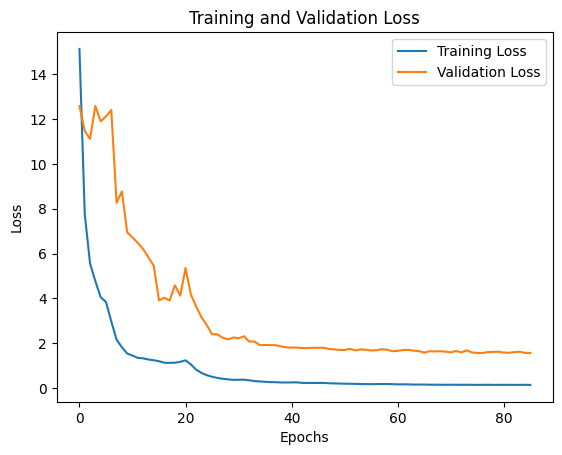

In [ ]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


## 6.6 Grad-CAM Heatmaps for Regional Importance

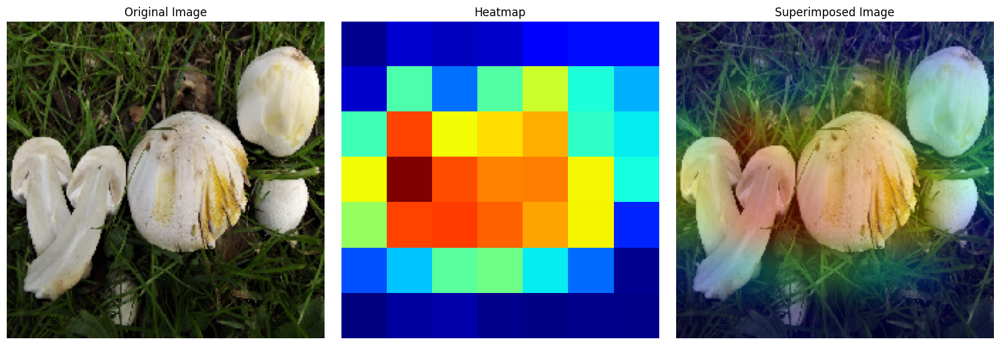

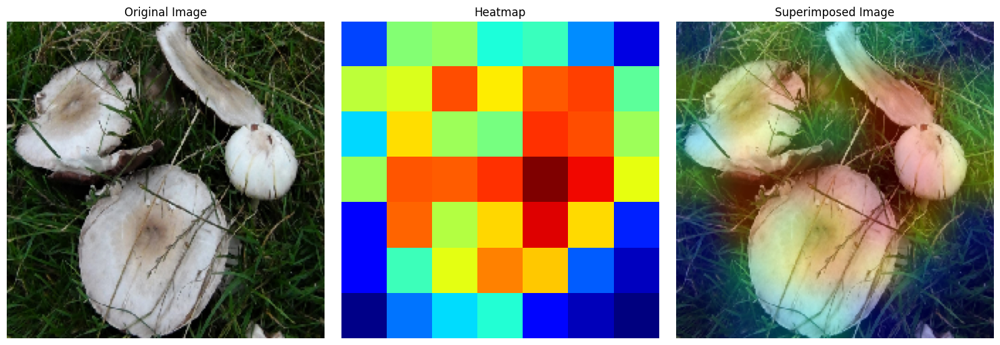

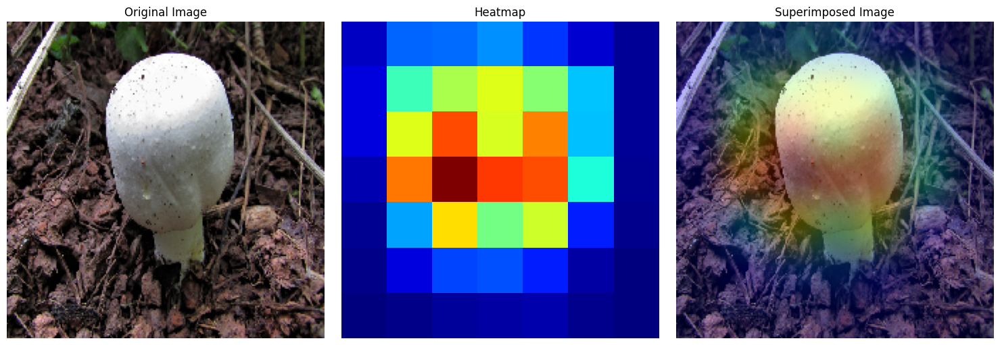

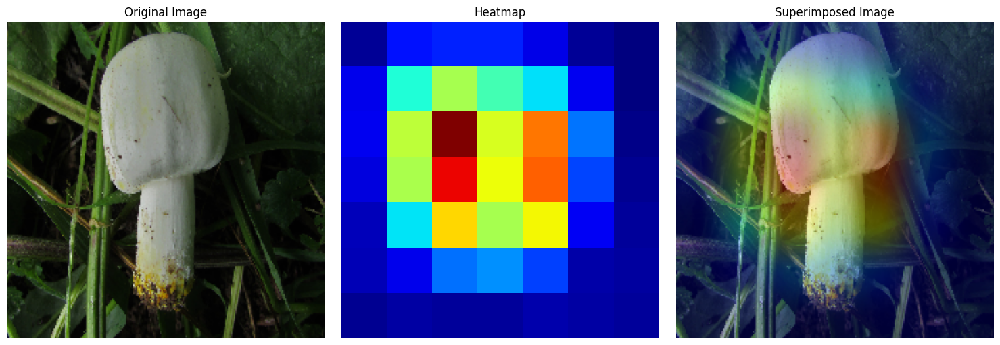

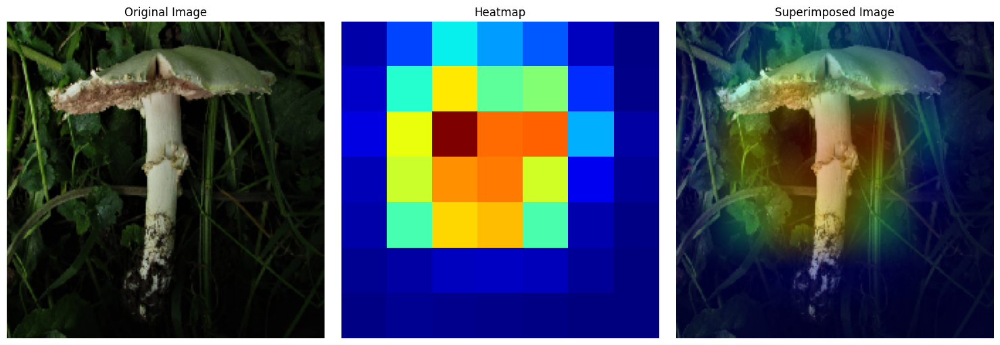

...

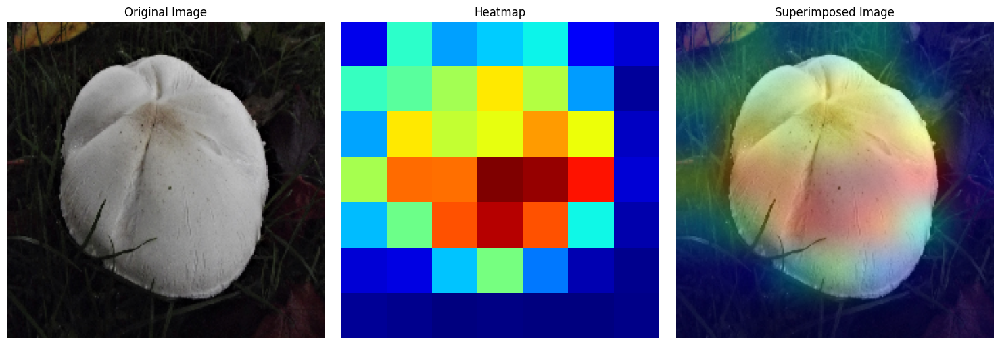

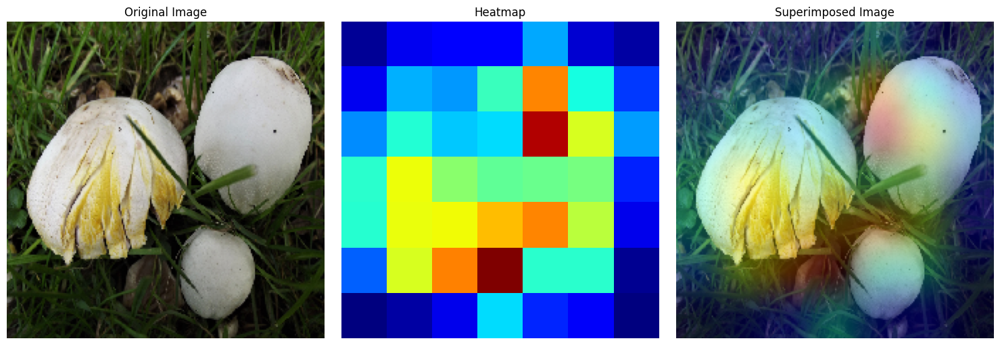

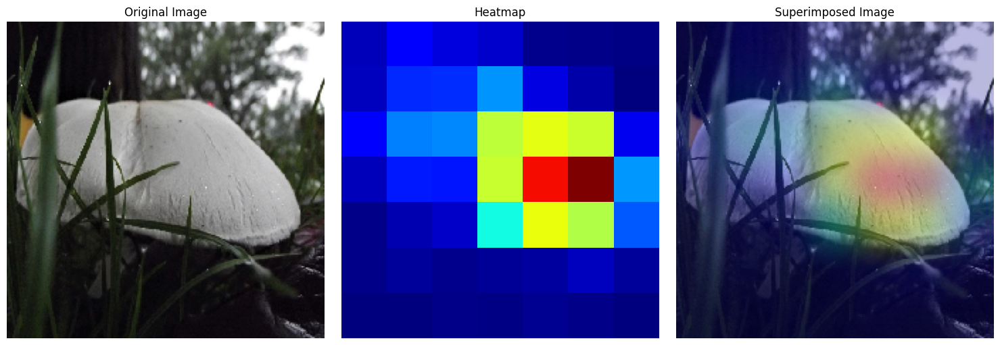

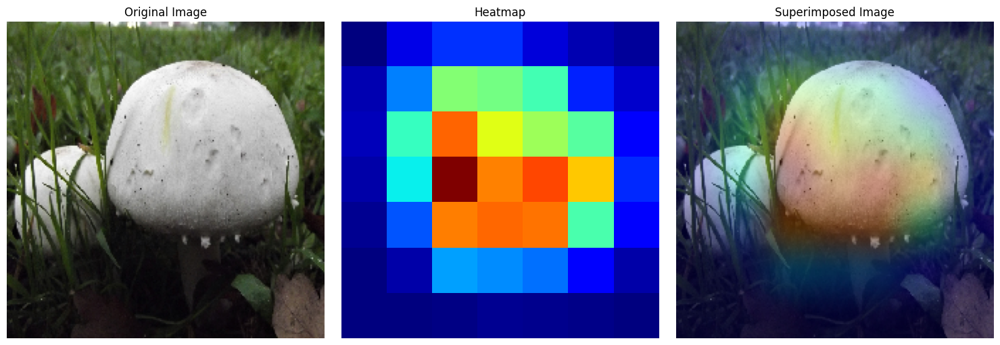

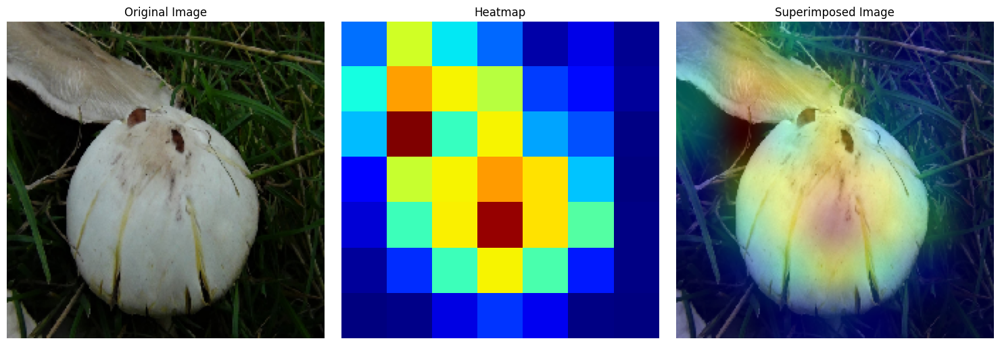

In [ ]:
import os
from IPython.display import display, HTML
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import keras
from keras.applications.mobilenet_v2 import MobileNetV2

img_size = (224, 224)
preprocess_input = keras.applications.xception.preprocess_input

# Last convolutional layer
last_conv_layer_name = "out_relu"

# Function to preprocess image
def get_img_array(img_path, size):
    img = keras.utils.load_img(img_path, target_size=size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# Function to generate GradCAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Function to create superimposed image
def get_superimposed_image(img_path, heatmap, alpha=0.4):
    img = keras.utils.load_img(img_path, target_size=img_size)
    img = keras.utils.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)
    jet = mpl.colormaps["jet"]
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    return keras.utils.array_to_img(superimposed_img)

# Path to grey_knight folder
grey_knight_folder = "/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/data/data/yellow_stainer"

# Load MobileNetV2 model
model_cam = MobileNetV2(weights="imagenet", include_top=True)
model_cam.layers[-1].activation = None

# Display all images in a single row
def display_images_row(original, heatmap, superimposed):
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original Image")
    plt.axis("off")

    # Heatmap
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap="jet")
    plt.title("Heatmap")
    plt.axis("off")

    # Superimposed Image
    plt.subplot(1, 3, 3)
    plt.imshow(superimposed)
    plt.title("Superimposed Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Loop through all images and display
for img_file in os.listdir(grey_knight_folder):
    img_path = os.path.join(grey_knight_folder, img_file)

    # Preprocess image and generate heatmap
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model_cam, last_conv_layer_name)

    # Get resized original image and superimposed image
    original_image = keras.utils.load_img(img_path, target_size=img_size)
    superimposed_image = get_superimposed_image(img_path, heatmap)

    # Display all images in a row
    display_images_row(original_image, heatmap, superimposed_image)


# 7. Model Application

## 7.1 Load Well-Trained Model

In [ ]:
from tensorflow.keras.models import load_model

# Load your trained model
trained_model = load_model("/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/my_model.keras")

## 7.2 Load and Show Outside Test Mushroom Image

In [ ]:
from google.colab import files
uploaded = files.upload()  # This will prompt you to upload an image


Saving common_puffball.jpg to common_puffball.jpg


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os


Uploaded Original Image: common_puffball.jpg


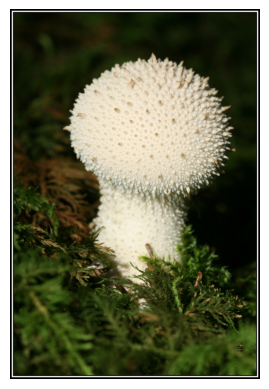

In [ ]:
# Get the filename of the uploaded image
image_path = list(uploaded.keys())[0]
print(f"Uploaded Original Image: {image_path}")


# Read the image using OpenCV
img = cv2.imread(image_path)

# Convert BGR to RGB (OpenCV loads images in BGR format, but matplotlib expects RGB)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Show the image using matplotlib
plt.imshow(img)
plt.axis('off')  # Hide the axes
plt.show()


## 7.3 Outside Image Format

Image loaded successfully, shape: (1024, 690, 3)
Formatted Image: 


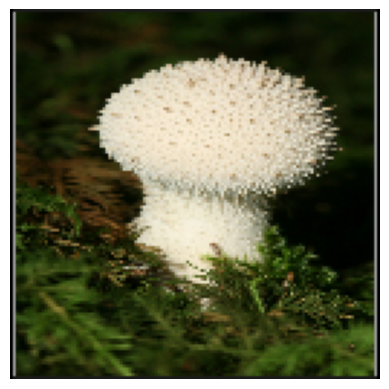

In [ ]:

# Get the uploaded image's filename
image_path = list(uploaded.keys())[0]

# Read the image using OpenCV
img = cv2.imread(image_path)

# Check if the image was loaded successfully
if img is None:
    print(f"Error: Image not loaded. Check the file path: {image_path}")
else:
    print(f"Image loaded successfully, shape: {img.shape}")

    # Convert to RGB (if required)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize the image to the model's input size (128x128)
    img = cv2.resize(img, (128, 128))

    # Normalize the image (if required by your model)
    img = img / 255.0

    # Add batch dimension (model expects a batch of images)
    img = np.expand_dims(img, axis=0)

    # Show the formatted image
    print("Formatted Image: ")
    plt.imshow(img[0])  # Display the first image in the batch
    plt.axis('off')  # Hide the axes
    plt.show()


## 7.4 Predict Outside Image Mushroom Type

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Predicted Class Index: 41
Predicted Class Name: common_puffball


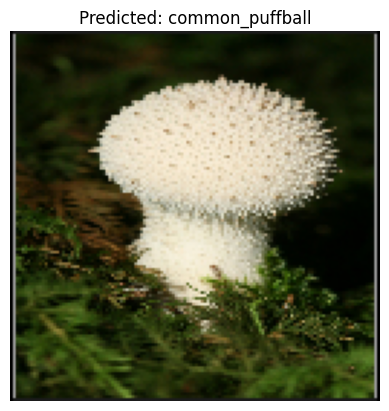

In [ ]:

# Predict using the model
predictions = trained_model.predict(img)

# Get the index of the predicted class (class with the highest probability)
predicted_class_index = np.argmax(predictions, axis=1)[0]

# Get the class name from class_list using the predicted index
predicted_class_name = class_list[predicted_class_index]

# Display the predictions and class name
print(f"Predicted Class Index: {predicted_class_index}")
print(f"Predicted Class Name: {predicted_class_name}")

# Optionally, display the image with the class name
plt.imshow(img[0])
plt.title(f"Predicted: {predicted_class_name}")
plt.axis('off')
plt.show()

## 7.5 Show Predicted Result's Images in Train Data

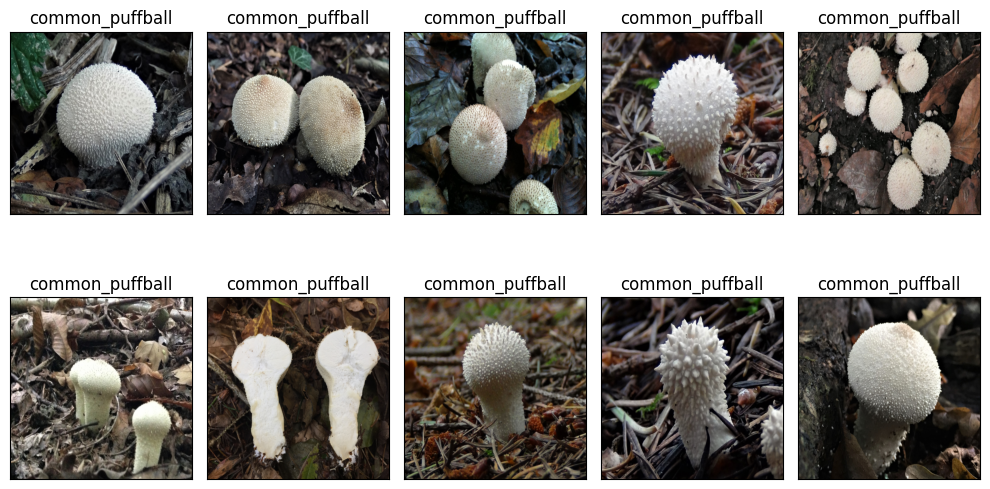

In [ ]:
# Predict the class for the input image
input_class = class_list[np.argmax(predictions)]

# Define the base directory of your training data
base_training_data_dir = '/content/drive/MyDrive/Colab Notebooks/css581/FinalProject/dataset/data/data/'

# Correctly create the path to the class folder
training_data_dir = os.path.join(base_training_data_dir, input_class)

# List to store predicted classes for all training images
predicted_classes = []

# Iterate over all images in the training data directory
for filename in os.listdir(training_data_dir):
    image_path = os.path.join(training_data_dir, filename)

    if image_path.lower().endswith(('png', 'jpg', 'jpeg')):  # Check for image files
        # Read the image
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        img = cv2.resize(img, (128, 128))  # Resize to 128x128
        img = img / 255.0  # Normalize if required
        img = np.expand_dims(img, axis=0)  # Add batch dimension

        # Predict the class for this image with verbose=0 to suppress output
        prediction = predictions  # Suppress the output
        predicted_class = class_list[np.argmax(prediction)]
        predicted_classes.append((filename, predicted_class))


# Optionally, you can visualize some of the training images with their predicted classes
plt.figure(figsize=(10, 6))
for i in range(min(10, len(predicted_classes))):  # Show up to 10 images
    image_path = os.path.join(training_data_dir, predicted_classes[i][0])
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    plt.xticks([])  # Hide x-axis
    plt.yticks([])  # Hide y-axis
    plt.imshow(img)
    plt.title(predicted_classes[i][1])  # Predicted class as title
plt.tight_layout()  # Ensures there's no overlap
plt.show()  # Explicitly show the plot
